In [1]:
!pip install vit-keras

  Preparing metadata (setup.py) ... done
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19581 sha256=f0ebaf8d936dc2af7d1ce06239e9c9d708a321ce6f846f95ec06029966aac9dd
  Stored in directory: /root/.cache/pip/wheels/3d/7c/f1/f87f51d07a2513aa0fb128d5eb504da1fcef9c87475d9eef64
Successfully built validators


In [2]:
import random
import os
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model
from vit_keras import vit

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, precision_recall_fscore_support,
                             accuracy_score, top_k_accuracy_score, f1_score, 
                             matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay)
from scikitplot.metrics import plot_roc

In [3]:
SEED = 42
HEIGHT = 224
WIDTH = 224
BATCH_SIZE = 32
CHANNELS = 3
IMAGE_SIZE = (HEIGHT, WIDTH, CHANNELS)

<a id='1'></a>
## Dataset Exploration

In [4]:
# Define paths
DATASET_PATH = "/kaggle/input/indian-birds/Birds_25/"
TRAIN_PATH = '/kaggle/input/indian-birds/Birds_25/train/'
TEST_PATH = '/kaggle/input/indian-birds/Birds_25/valid/'

In [5]:
%%time
# Image paths with glob
train_images = glob.glob(f"{TRAIN_PATH}**/*.jpg")
test_images = glob.glob(f"{TEST_PATH}**/*.jpg")

CPU times: user 86.9 ms, sys: 43.7 ms, total: 131 ms
Wall time: 3.37 s


In [6]:
# Get data sizes
train_size = len(train_images)
test_size = len(test_images)
total = train_size + test_size

# View samples counts
print(f'Train samples:\t{train_size:>6}')
print(f'Test samples:\t{test_size:>6}')
print('----------------------')
print(f'TOTAL:\t\t{total:>6}')

Train samples:	 30000
Test samples:	  7500
----------------------
TOTAL:		 37500


In [7]:
def extract_label(image_path):
    """
    Extract the label from an image path.
    """
    return image_path.split('/')[-2].replace('-', '_')

def build_dataframe(image_paths, seed=SEED):
    """
    Build a shuffled dataframe containing image paths and their corresponding labels.

    Args:
        image_paths (list): List of image file paths.
        seed (int): Random seed for shuffling the dataframe.

    Returns:
        pd.DataFrame: A shuffled dataframe with 'image_path' and 'label' columns.
    """

    # Generate labels
    labels = [extract_label(path) for path in image_paths]
    
    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': labels
    })

    # Shuffle and return dataframe
    return df.sample(frac=1, random_state=seed).reset_index(drop=True)

In [8]:
# Build the DataFrames
train_df = build_dataframe(train_images)
test_df = build_dataframe(test_images)

In [9]:
# View first 5 samples in the training set
train_df.head(5)

,image_path,label
0,/kaggle/input/indian-birds/Birds_25/train/Asia...,Asian_Green_Bee_Eater
1,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Breasted_Kingfisher
2,/kaggle/input/indian-birds/Birds_25/train/Gray...,Gray_Wagtail
3,/kaggle/input/indian-birds/Birds_25/train/Rudd...,Ruddy_Shelduck
4,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common_Kingfisher


In [10]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Encode labels
train_df['label_encoded'] = label_encoder.fit_transform(train_df.label)
test_df['label_encoded'] = label_encoder.transform(test_df.label)

# View samples
train_df.head(10)

,image_path,label,label_encoded
0,/kaggle/input/indian-birds/Birds_25/train/Asia...,Asian_Green_Bee_Eater,0
1,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Breasted_Kingfisher,22
2,/kaggle/input/indian-birds/Birds_25/train/Gray...,Gray_Wagtail,9
3,/kaggle/input/indian-birds/Birds_25/train/Rudd...,Ruddy_Shelduck,19
4,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common_Kingfisher,3
5,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common_Tailorbird,6
6,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Wagtail,24
7,/kaggle/input/indian-birds/Birds_25/train/Brow...,Brown_Headed_Barbet,1
8,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Breasted_Waterhen,23
9,/kaggle/input/indian-birds/Birds_25/train/Copp...,Coppersmith_Barbet,7


In [11]:
# Classes info
NUM_CLASSES = len(label_encoder.classes_)
class_names = label_encoder.classes_

print(f'Number of classes: {NUM_CLASSES}')
print(f'Classes: {class_names}')

Number of classes: 25
Classes: ['Asian_Green_Bee_Eater' 'Brown_Headed_Barbet' 'Cattle_Egret'
 'Common_Kingfisher' 'Common_Myna' 'Common_Rosefinch' 'Common_Tailorbird'
 'Coppersmith_Barbet' 'Forest_Wagtail' 'Gray_Wagtail' 'Hoopoe'
 'House_Crow' 'Indian_Grey_Hornbill' 'Indian_Peacock' 'Indian_Pitta'
 'Indian_Roller' 'Jungle_Babbler' 'Northern_Lapwing' 'Red_Wattled_Lapwing'
 'Ruddy_Shelduck' 'Rufous_Treepie' 'Sarus_Crane'
 'White_Breasted_Kingfisher' 'White_Breasted_Waterhen' 'White_Wagtail']


In [12]:
def load_image(image_path):
    """
    Load and preprocess an image.
    
    Args:
        image_path (str): Path to the image file.
        height (int): Target height for resizing the image.
        width (int): Target width for resizing the image.
    
    Returns:
        tf.Tensor: The preprocessed image as a float32 tensor.
    """
    # Read and decode the image file
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image, channels=3)
    
    # Resize image
    image = tf.image.resize(image, [HEIGHT, WIDTH], method=tf.image.ResizeMethod.LANCZOS5)
    
    # Normalize image to [0, 1]
    image = tf.cast(image, tf.float32) / 255.0
    
    return image

def display_image(image, label, color_map='rgb', fig_size=(8, 10)):
    """
    Display an image with its corresponding label.
    
    Args:
        image (tf.Tensor): The image tensor to display.
        label (str): The label associated with the image.
        color_map (str): The color map to use for displaying grayscale images ('rgb' for RGB, or 'gray' for grayscale).
        fig_size (tuple): The size of the figure for displaying the image.
    
    Returns:
        None
    """
    plt.figure(figsize=fig_size)
    
    if color_map == 'rgb':
        plt.imshow(image)
    else:
        # Convert image to grayscale and display it
        plt.imshow(tf.image.rgb_to_grayscale(image), cmap=color_map)
    
    # Display title with the label
    plt.title(f'Label: {label}', fontsize=16)
    plt.axis('off')  # Optionally remove axes for better visualization
    plt.show()


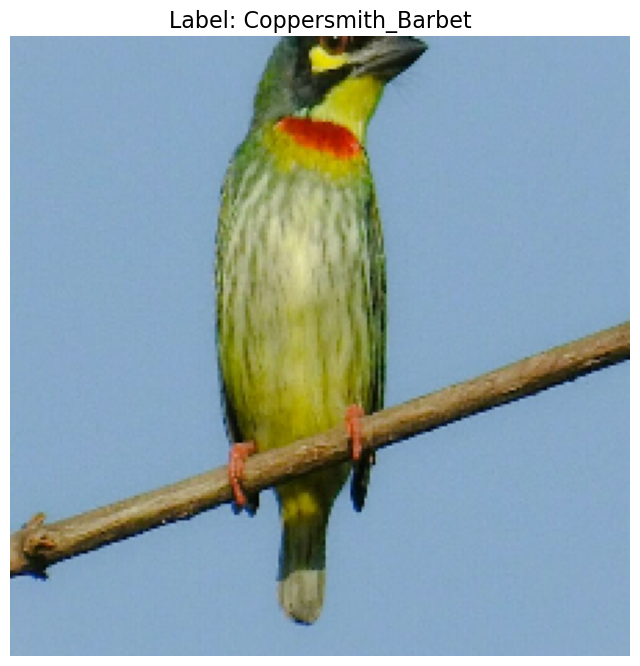

In [13]:
# Select random sample from train_df
idx = random.sample(train_df.index.to_list(), 1)[0]
sample_image, sample_label = load_image(train_df.image_path[idx]), train_df.label[idx]

# View sample
display_image(sample_image, sample_label)

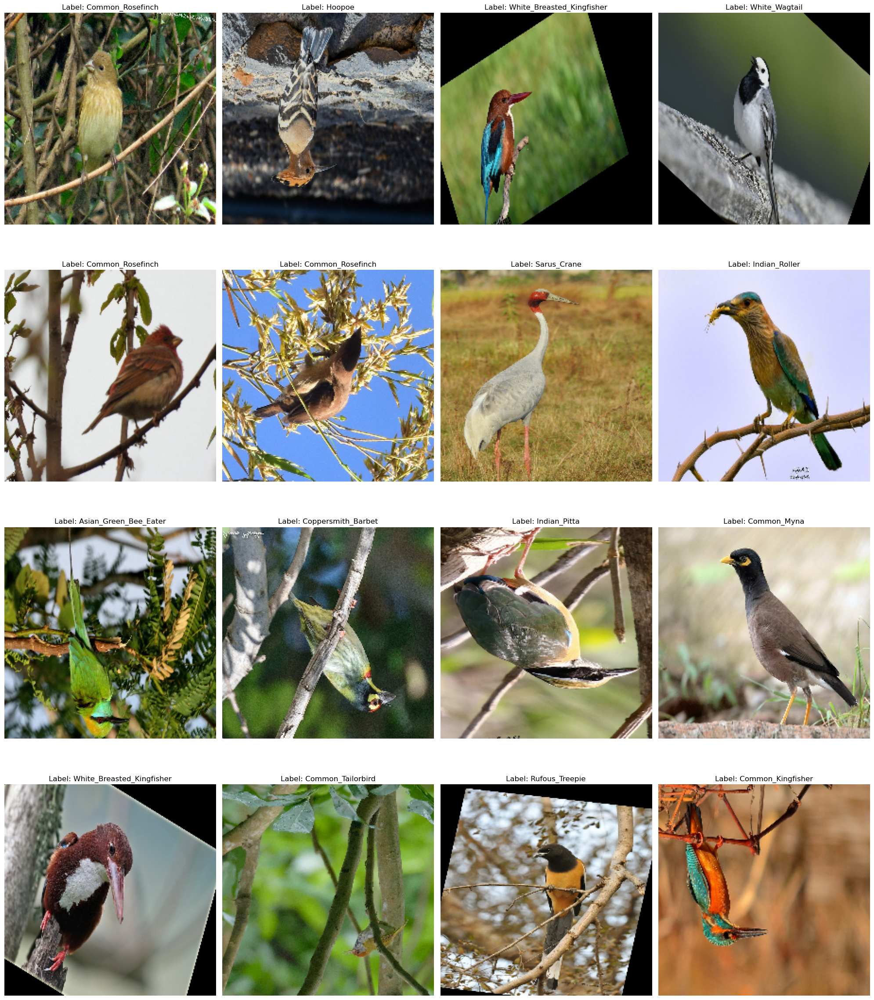

In [14]:
def view_multiple_samples(df, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = (count + 3) // 4
    sampled_idx = random.sample(df.index.to_list(), count)

    fig = plt.figure(figsize=fig_size)
    

    for idx, image_idx in enumerate(sampled_idx):
        plt.subplot(rows, 4, idx + 1)
        plt.title(f'Label: {df.label[image_idx]}')

        # Load and display the image
        image = sample_loader(df.image_path[image_idx])
        
        if color_map == 'rgb':
            plt.imshow(image)
        else:
            grayscale_image = tf.image.rgb_to_grayscale(image)
            plt.imshow(grayscale_image, cmap=color_map)

        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# View samples
view_multiple_samples(
    train_df, load_image, 
    count=16, fig_size=(20, 24)
)

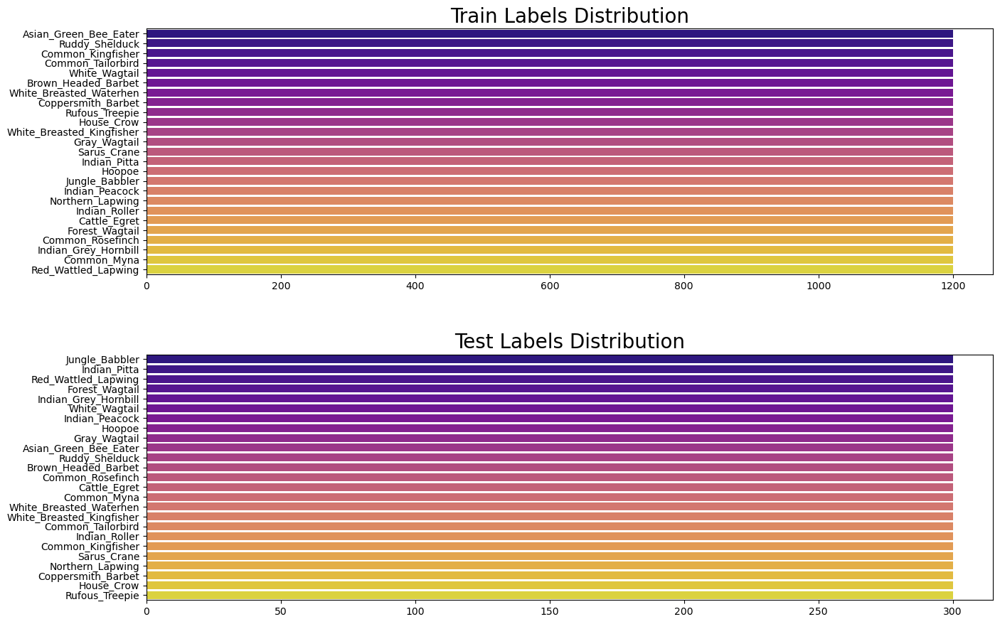

In [15]:
def plot_label_distribution(ax, data, title, palette):
    """Helper function to plot label distribution with a custom color palette."""
    distribution = data['label'].value_counts().sort_values()
    ax.set_title(title, fontsize=20)
    sns.barplot(x=distribution.values,
                y=list(distribution.keys()),
                orient="h",
                ax=ax,
                palette=palette)

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot Train and Test Labels Distribution with custom palette
plot_label_distribution(ax1, train_df, 'Train Labels Distribution', palette='plasma')
plot_label_distribution(ax2, test_df, 'Test Labels Distribution', palette='plasma')

plt.show()

<a id='2'></a>
## Data Preprocessing: Building An Input Data Pipeline

In [16]:
TF_SEED = 768
BATCH_SIZE = 32

In [17]:
# Create Train/Val split with Training Set
train_split_idx, val_split_idx, _, _ = train_test_split(train_df.index, 
                                                        train_df.label_encoded, 
                                                        test_size=0.20,
                                                        stratify=train_df.label_encoded,
                                                        random_state=SEED)

In [18]:
# Get new training and validation data
train_new_df = train_df.iloc[train_split_idx].reset_index(drop=True)
val_df = train_df.iloc[val_split_idx].reset_index(drop=True)

In [19]:
train_size = len(train_new_df)
val_size = len(val_df)
test_size = len(test_df)
total = train_size + val_size + test_size

# View counts
print(f'Train samples:\t\t{train_size:>6} ({100 * train_size / total:>5.2f}%)')
print(f'Validation samples:\t{val_size:>6} ({100 * val_size / total:>5.2f}%)')
print(f'Test samples:\t\t{test_size:>6} ({100 * test_size / total:>5.2f}%)')

Train samples:		 24000 (64.00%)
Validation samples:	  6000 (16.00%)
Test samples:		  7500 (20.00%)


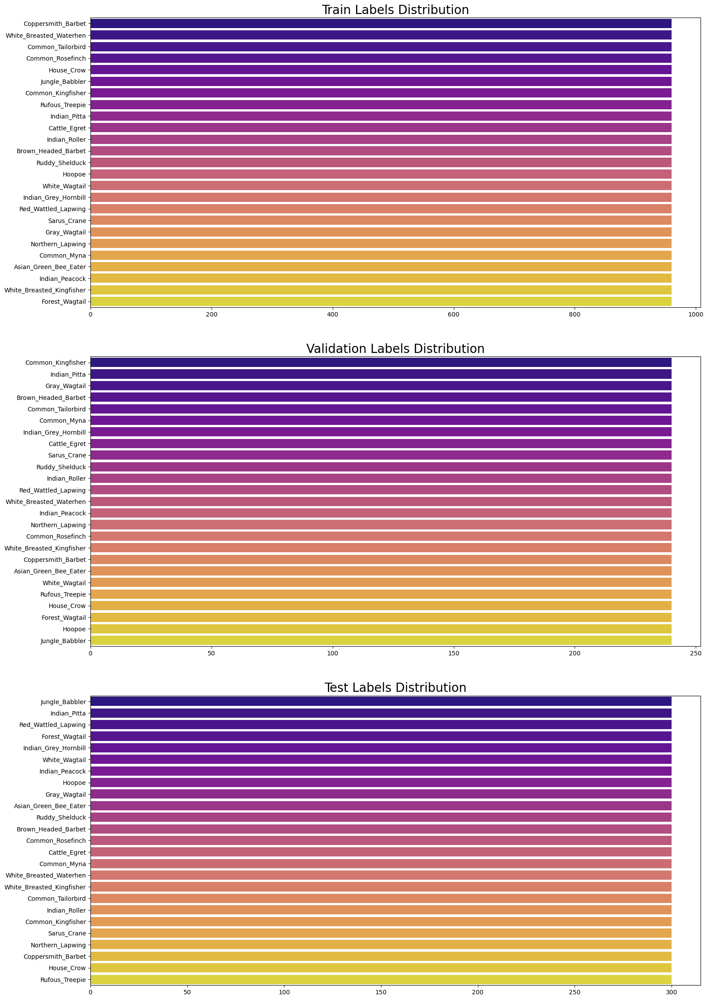

In [20]:
# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(16, 24))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot Train, Validation, and Test Labels Distribution with custom palette
plot_label_distribution(ax1, train_new_df, 'Train Labels Distribution', palette='plasma')
plot_label_distribution(ax2, val_df, 'Validation Labels Distribution', palette='plasma')
plot_label_distribution(ax3, test_df, 'Test Labels Distribution', palette='plasma')

plt.show()

In [21]:
# Define the augmentation layer
augmentation_layer = Sequential(
    [
        layers.RandomFlip(mode='horizontal_and_vertical', seed=TF_SEED),
        layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), seed=TF_SEED),
    ],
    name='augmentation_layer'
)

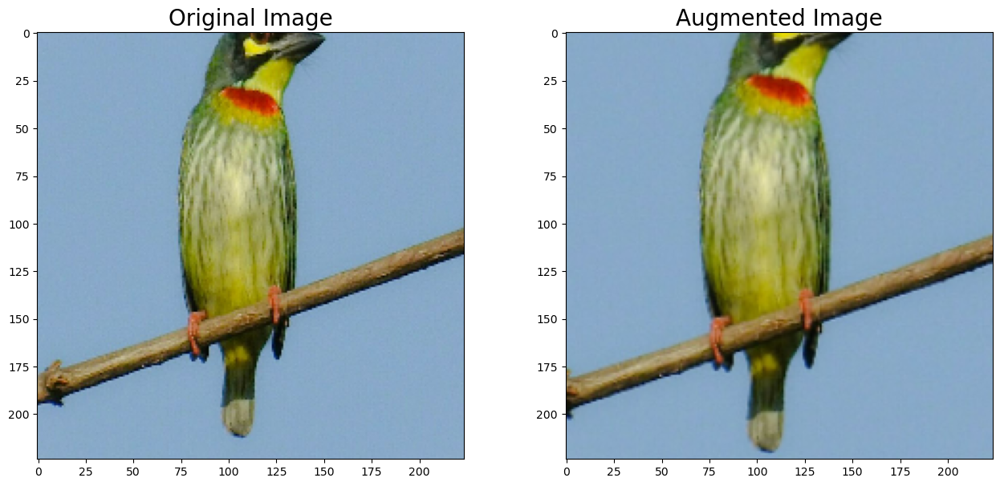

In [22]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(sample_image);

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(augmentation_layer(sample_image));

In [23]:
import tensorflow as tf

def encode_labels(labels, encode_depth=25):
    """
    Encodes labels using one-hot encoding.
    
    Args:
        labels (array-like): Labels to encode.
        encode_depth (int): Depth of the one-hot encoding. 25 labels
    
    Returns:
        np.ndarray: One-hot encoded labels as a NumPy array.
    """
    return tf.one_hot(labels, depth=encode_depth).numpy()

def create_pipeline(
    df, 
    load_function, 
    augment=False, 
    batch_size=32, 
    shuffle=False, 
    cache=None, 
    prefetch=False
):
    """
    Generates a TensorFlow input pipeline from a Pandas DataFrame using the tf.data API.
    
    Args:
        df (pd.DataFrame): DataFrame containing image paths and labels.
        load_function (function): Function to load images from paths.
        augment (bool): Whether to apply data augmentation. Defaults to False.
        batch_size (int): Batch size for the dataset. Defaults to 32.
        shuffle (bool): Whether to shuffle the dataset. Defaults to False.
        cache (str or None): Path for caching data. Defaults to None.
        prefetch (bool): Whether to enable data prefetching. Defaults to False.
    
    Returns:
        tf.data.Dataset: TensorFlow dataset for model input.
    """
    # Extract image paths and encoded labels
    image_paths = df["image_path"]
    image_labels = encode_labels(df["label_encoded"])
    AUTOTUNE = tf.data.AUTOTUNE

    # Create a dataset from tensor slices
    ds = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))

    # Apply image loading and optional augmentation
    def process_image(image_path, label):
        image = load_function(image_path)
        if augment:
            image = augmentation_layer(image)
        return image, label

    ds = ds.map(process_image, num_parallel_calls=AUTOTUNE)

    # Shuffle the dataset if enabled
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)

    # Apply batching
    ds = ds.batch(batch_size)

    # Cache the dataset if a cache path or in-memory cache is specified
    if cache is not None:
        ds = ds.cache(cache)

    # Enable prefetching for performance optimization
    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)

    return ds


In [24]:
# Generate Train Input Pipeline
train_ds = create_pipeline(train_new_df, load_image, augment=False, 
                           batch_size=BATCH_SIZE, 
                           shuffle=False, prefetch=True)

# Generate Validation Input Pipeline
val_ds = create_pipeline(val_df, load_image, 
                         batch_size=BATCH_SIZE, 
                         shuffle=False, prefetch=False)

# Generate Test Input Pipeline
test_ds = create_pipeline(test_df, load_image, 
                          batch_size=BATCH_SIZE, 
                          shuffle=False, prefetch=False)

In [25]:
# View string representation of datasets
print('========================================')
print('Train Input Data Pipeline:\n\n', train_ds)
print('========================================')
print('Validation Input Data Pipeline:\n\n', val_ds)
print('========================================')
print('Test Input Data Pipeline:\n\n', test_ds)
print('========================================')

Train Input Data Pipeline:

 <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>
Validation Input Data Pipeline:

 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>
Test Input Data Pipeline:

 <BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>


<a id='3'></a>
## Train Template

In [26]:
def train_model(
    model, num_epochs, callbacks, train_data, 
    valid_data=None, shuffle=False):
    """
    Trains a TensorFlow model and returns the training history.
    
    Args:
        model (tf.keras.Model): The model to be trained.
        num_epochs (int): Number of epochs for training.
        callbacks (list): List of callback functions.
        train_data (tf.data.Dataset): Dataset for training.
        valid_data (tf.data.Dataset, optional): Dataset for validation. Default is None.
        shuffle (bool): Whether to shuffle the training data. Default is False.
    
    Returns:
        tf.keras.callbacks.History: History object containing loss and metrics during training.
    """
    if valid_data:
        history = model.fit(
            train_data,
            epochs=num_epochs,
            validation_data=valid_data,
            callbacks=callbacks,
            shuffle=shuffle
        )
    else:
        history = model.fit(
            train_data,
            epochs=num_epochs,
            callbacks=callbacks,
            shuffle=shuffle
        )
    return history

In [27]:
# Define Early Stopping Callback
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

# Define Reduce Learning Rate Callback
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,
    factor=0.1,
    verbose=1
)

# List of callbacks and metrics
CALLBACKS = [early_stopping_callback, reduce_lr_callback]
METRICS = ['accuracy']

<a id='4'></a>
## Transfer Learning Model: ResNet50

In [28]:
# Get Resnet 50
resnet50 = hub.KerasLayer(
    "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/5",
    trainable=False,
    name="resnet50"
)

In [29]:
# Initialize weights with GlorotNormal (Xavier initialization)
initializer = tf.keras.initializers.GlorotNormal(seed=SEED)

# Build the Sequential model
model_resnet_50 = Sequential([
    layers.Input(shape=IMAGE_SIZE, dtype=tf.float32, name='input_image'),
    resnet50,
    layers.Dropout(0.2, name='dropout_layer'),
    layers.Dense(512, activation='relu', kernel_initializer=initializer, name='dense_512'),
    layers.Dense(256, activation='relu', kernel_initializer=initializer, name='dense_256'),
    layers.Dense(NUM_CLASSES, activation='softmax', kernel_initializer=initializer, name='output_layer')
], name='resnet_50_sequential_model')

# Print a summary of the model
model_resnet_50.summary()

Model: "resnet_50_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (KerasLayer)       (None, 2048)              23564800  
                                                                 
 dropout_layer (Dropout)     (None, 2048)              0         
                                                                 
 dense_512 (Dense)           (None, 512)               1049088   
                                                                 
 dense_256 (Dense)           (None, 256)               131328    
                                                                 
 output_layer (Dense)        (None, 25)                6425      
                                                                 
Total params: 24,751,641
Trainable params: 1,186,841
Non-trainable params: 23,564,800
_________________________________________________________________


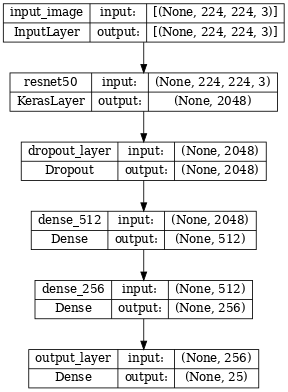

In [30]:
# Explore model visually
plot_model(
    model_resnet_50, dpi=60,
    show_shapes=True
)

In [31]:
# Set random seed
tf.random.set_seed(SEED)

# Compile the model
model_resnet_50.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=METRICS
)

# Log training information
print(f"Training {model_resnet_50.name}.")
print(f"Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.")
print("----------------------------------")

# Train the model and capture history
resnet_50_history = train_model(
    model=model_resnet_50,
    num_epochs=5, # Change
    callbacks=CALLBACKS,
    train_data=train_ds,
    valid_data=val_ds,
    shuffle=False
)

Training resnet_50_sequential_model.
Train on 24000 samples, validate on 6000 samples.
----------------------------------
Epoch 1/5
750/750 [==============================] - 233s 297ms/step - loss: 0.7416 - accuracy: 0.7775 - val_loss: 0.4986 - val_accuracy: 0.8427 - lr: 0.0010
Epoch 2/5
750/750 [==============================] - 185s 246ms/step - loss: 0.4085 - accuracy: 0.8695 - val_loss: 0.4844 - val_accuracy: 0.8492 - lr: 0.0010
Epoch 3/5
750/750 [==============================] - 185s 246ms/step - loss: 0.3082 - accuracy: 0.8981 - val_loss: 0.4348 - val_accuracy: 0.8660 - lr: 0.0010
Epoch 4/5
750/750 [==============================] - 184s 245ms/step - loss: 0.2413 - accuracy: 0.9196 - val_loss: 0.5062 - val_accuracy: 0.8550 - lr: 0.0010
Epoch 5/5
750/750 [==============================] - 184s 246ms/step - loss: 0.2058 - accuracy: 0.9306 - val_loss: 0.4060 - val_accuracy: 0.8813 - lr: 0.0010


In [32]:
# Evaluate the model
resnet_50_evaluation = model_resnet_50.evaluate(test_ds)

235/235 [==============================] - 55s 235ms/step - loss: 0.4225 - accuracy: 0.8795


In [33]:
# Generate model probabilities and associated predictions
resnet_50_test_probabilities = model_resnet_50.predict(test_ds, verbose=1)
resnet_50_test_predictions = tf.argmax(resnet_50_test_probabilities, axis=1)

235/235 [==============================] - 47s 199ms/step


<a id="5"></a>
## Transfer Learning Model: EfficientNet V2 B0

In [34]:
# Get EfficientNet V2 B0
efficientnet_v2_b0 = hub.KerasLayer(
    "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b0/feature_vector/2",
    trainable=False,
    name="efficientnet_v2_b0"
)

In [35]:
# Initialize weights with GlorotNormal (Xavier initialization)
initializer = tf.keras.initializers.GlorotNormal(seed=SEED)

# Build the Sequential model
model_efficientnet_v2 = Sequential([
    layers.Input(shape=IMAGE_SIZE, dtype=tf.float32, name='input_image'),
    efficientnet_v2_b0,
    layers.Dropout(0.2, name='dropout_layer'),
    layers.Dense(512, activation='relu', kernel_initializer=initializer, name='dense_512'),
    layers.Dense(256, activation='relu', kernel_initializer=initializer, name='dense_256'),
    layers.Dense(NUM_CLASSES, activation='softmax', kernel_initializer=initializer, name='output_layer')
], name='efficientnet_v2_sequential_model')

# Print a summary of the model
model_efficientnet_v2.summary()

Model: "efficientnet_v2_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet_v2_b0 (KerasLa  (None, 1280)             5919312   
 yer)                                                            
                                                                 
 dropout_layer (Dropout)     (None, 1280)              0         
                                                                 
 dense_512 (Dense)           (None, 512)               655872    
                                                                 
 dense_256 (Dense)           (None, 256)               131328    
                                                                 
 output_layer (Dense)        (None, 25)                6425      
                                                                 
Total params: 6,712,937
Trainable params: 793,625
Non-trainable params: 5,919,312
__________________

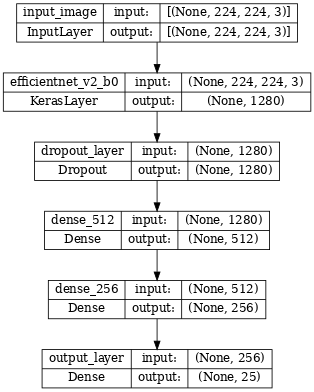

In [36]:
# Explore model visually
plot_model(
    model_efficientnet_v2, dpi=60,
    show_shapes=True
)

In [37]:
# Set random seed
tf.random.set_seed(SEED)

# Compile the model
model_efficientnet_v2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=METRICS
)

# Log training information
print(f"Training {model_efficientnet_v2.name}.")
print(f"Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.")
print("----------------------------------")

# Train the model and capture history
efficientnet_v2_history = train_model(
    model=model_efficientnet_v2,
    num_epochs=5, # Change
    callbacks=CALLBACKS,
    train_data=train_ds,
    valid_data=val_ds,
    shuffle=False
)

Training efficientnet_v2_sequential_model.
Train on 24000 samples, validate on 6000 samples.
----------------------------------
Epoch 1/5
750/750 [==============================] - 192s 246ms/step - loss: 0.4205 - accuracy: 0.8733 - val_loss: 0.2373 - val_accuracy: 0.9227 - lr: 0.0010
Epoch 2/5
750/750 [==============================] - 184s 245ms/step - loss: 0.1984 - accuracy: 0.9361 - val_loss: 0.1881 - val_accuracy: 0.9428 - lr: 0.0010
Epoch 3/5
750/750 [==============================] - 184s 245ms/step - loss: 0.1469 - accuracy: 0.9532 - val_loss: 0.1715 - val_accuracy: 0.9473 - lr: 0.0010
Epoch 4/5
750/750 [==============================] - 183s 244ms/step - loss: 0.1272 - accuracy: 0.9594 - val_loss: 0.2005 - val_accuracy: 0.9407 - lr: 0.0010
Epoch 5/5
750/750 [==============================] - 184s 245ms/step - loss: 0.1121 - accuracy: 0.9643 - val_loss: 0.1649 - val_accuracy: 0.9512 - lr: 0.0010


In [38]:
# Evaluate the model
efficientnet_v2_evaluation = model_efficientnet_v2.evaluate(test_ds)

235/235 [==============================] - 46s 198ms/step - loss: 0.1659 - accuracy: 0.9524


In [39]:
# Generate model probabilities and associated predictions
efficientnet_v2_test_probabilities = model_efficientnet_v2.predict(test_ds, verbose=1)
efficientnet_v2_test_predictions = tf.argmax(efficientnet_v2_test_probabilities, axis=1)

235/235 [==============================] - 46s 194ms/step


<a id="6"></a>
## Transfer Learning Model: MobileNet V2

In [40]:
# Load MobileNet V2 from TensorFlow Hub
mobilenet_v2 = hub.KerasLayer(
    "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4", 
    trainable=False,
    name="mobilenet_v2"
)

In [41]:
# Initialize weights with GlorotNormal (Xavier initialization)
initializer = tf.keras.initializers.GlorotNormal(seed=SEED)

# Build the Sequential model
model_mobilenet_v2 = Sequential([
    layers.Input(shape=IMAGE_SIZE, dtype=tf.float32, name='input_image'),
    mobilenet_v2,
    layers.Dropout(0.2, name='dropout_layer'),
    layers.Dense(512, activation='relu', kernel_initializer=initializer, name='dense_512'),
    layers.Dense(256, activation='relu', kernel_initializer=initializer, name='dense_256'),
    layers.Dense(NUM_CLASSES, activation='softmax', kernel_initializer=initializer, name='output_layer')
], name='mobilenet_v2_sequential_model')

# Print a summary of the model
model_mobilenet_v2.summary()

Model: "mobilenet_v2_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_v2 (KerasLayer)   (None, 1280)              2257984   
                                                                 
 dropout_layer (Dropout)     (None, 1280)              0         
                                                                 
 dense_512 (Dense)           (None, 512)               655872    
                                                                 
 dense_256 (Dense)           (None, 256)               131328    
                                                                 
 output_layer (Dense)        (None, 25)                6425      
                                                                 
Total params: 3,051,609
Trainable params: 793,625
Non-trainable params: 2,257,984
_________________________________________________________________


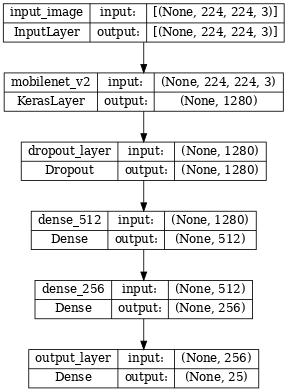

In [42]:
# Explore model visually
plot_model(
    model_mobilenet_v2, dpi=60,
    show_shapes=True
)

In [43]:
# Set random seed
tf.random.set_seed(SEED)

# Compile the model
model_mobilenet_v2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=METRICS
)

# Log training information
print(f"Training {model_mobilenet_v2.name}.")
print(f"Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.")
print("----------------------------------")

# Train the model and capture history
mobilenet_v2_history = train_model(
    model=model_mobilenet_v2,
    num_epochs=5, # Change
    callbacks=CALLBACKS,
    train_data=train_ds,
    valid_data=val_ds,
    shuffle=False
)

Training mobilenet_v2_sequential_model.
Train on 24000 samples, validate on 6000 samples.
----------------------------------
Epoch 1/5
750/750 [==============================] - 187s 244ms/step - loss: 0.6105 - accuracy: 0.8168 - val_loss: 0.3359 - val_accuracy: 0.8963 - lr: 0.0010
Epoch 2/5
750/750 [==============================] - 183s 244ms/step - loss: 0.3237 - accuracy: 0.8989 - val_loss: 0.3187 - val_accuracy: 0.8995 - lr: 0.0010
Epoch 3/5
750/750 [==============================] - 183s 244ms/step - loss: 0.2399 - accuracy: 0.9208 - val_loss: 0.3061 - val_accuracy: 0.9128 - lr: 0.0010
Epoch 4/5
750/750 [==============================] - 183s 244ms/step - loss: 0.1964 - accuracy: 0.9350 - val_loss: 0.3256 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 5/5
750/750 [==============================] - ETA: 0s - loss: 0.1714 - accuracy: 0.9435
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
750/750 [==============================] - 183s 244ms/step - loss: 0.17

In [44]:
# Evaluate the model
mobilenet_v2_evaluation = model_mobilenet_v2.evaluate(test_ds)

235/235 [==============================] - 46s 194ms/step - loss: 0.3147 - accuracy: 0.9105


In [45]:
# Generate model probabilities and associated predictions
mobilenet_v2_test_probabilities = model_mobilenet_v2.predict(test_ds, verbose=1)
mobilenet_v2_test_predictions = tf.argmax(mobilenet_v2_test_probabilities, axis=1)

235/235 [==============================] - 46s 193ms/step


<a id='7'></a>
## Transfer Learning Model: Vision Transformer

In [46]:
# Download the Vision Transformer (ViT) model
vit_model = vit.vit_b32(
    image_size=HEIGHT,
    activation='softmax',
    pretrained=True,
    include_top=False,
    pretrained_top=False,
    classes=NUM_CLASSES
)

# Freeze all layers for inference (set layers to non-trainable)
for layer in vit_model.layers:
    layer.trainable = False

353253686/353253686 [==============================] - 5s 0us/step


/opt/conda/lib/python3.7/site-packages/vit_keras/utils.py:83: UserWarning: Resizing position embeddings from 12, 12 to 7, 7
  UserWarning,


In [47]:
initializer = tf.keras.initializers.GlorotNormal(seed=SEED)
    
model_vit_b32 = Sequential([
    layers.Input(shape=IMAGE_SIZE, dtype=tf.float32, name='input_image'),
    vit_model,
    layers.Dropout(0.2, name='dropout_layer'),
    layers.Dense(512, activation='relu', kernel_initializer=initializer, name='dense_512'),
    layers.Dense(256, activation='relu', kernel_initializer=initializer, name='dense_256'),
    layers.Dense(NUM_CLASSES, activation='softmax', kernel_initializer=initializer, name='output_layer')
], name='vit_b32_sequential_model')

# Generate Summary of the Model
model_vit_b32.summary()

Model: "vit_b32_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vit-b32 (Functional)        (None, 768)               87455232  
                                                                 
 dropout_layer (Dropout)     (None, 768)               0         
                                                                 
 dense_512 (Dense)           (None, 512)               393728    
                                                                 
 dense_256 (Dense)           (None, 256)               131328    
                                                                 
 output_layer (Dense)        (None, 25)                6425      
                                                                 
Total params: 87,986,713
Trainable params: 531,481
Non-trainable params: 87,455,232
_________________________________________________________________


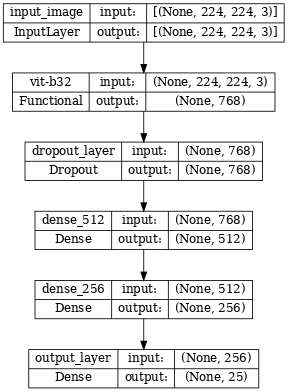

In [48]:
# Explore model visually
plot_model(
    model_vit_b32, dpi=60,
    show_shapes=True
)

In [49]:
# Set random seed
tf.random.set_seed(SEED)

# Compile the model
model_vit_b32.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=METRICS
)

# Train the model 
print(f'Training {model_vit_b32.name}.')
print(f'Train on {len(train_new_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

# Train the model and capture history
vit_b32_history = train_model(
    model=model_vit_b32,
    num_epochs=5, # Change
    callbacks=CALLBACKS,
    train_data=train_ds,
    valid_data=val_ds,
    shuffle=False
)

Training vit_b32_sequential_model.
Train on 24000 samples, validate on 6000 samples.
----------------------------------
Epoch 1/5
750/750 [==============================] - 211s 265ms/step - loss: 0.6202 - accuracy: 0.8081 - val_loss: 0.3435 - val_accuracy: 0.8932 - lr: 0.0010
Epoch 2/5
750/750 [==============================] - 194s 259ms/step - loss: 0.3891 - accuracy: 0.8765 - val_loss: 0.2897 - val_accuracy: 0.9078 - lr: 0.0010
Epoch 3/5
750/750 [==============================] - 195s 259ms/step - loss: 0.3252 - accuracy: 0.8951 - val_loss: 0.2661 - val_accuracy: 0.9173 - lr: 0.0010
Epoch 4/5
750/750 [==============================] - 195s 260ms/step - loss: 0.2886 - accuracy: 0.9052 - val_loss: 0.2768 - val_accuracy: 0.9182 - lr: 0.0010
Epoch 5/5
750/750 [==============================] - 195s 260ms/step - loss: 0.2534 - accuracy: 0.9163 - val_loss: 0.2541 - val_accuracy: 0.9257 - lr: 0.0010


In [50]:
# Evaluate the model
vit_b32_evaluation = model_vit_b32.evaluate(test_ds)

235/235 [==============================] - 49s 209ms/step - loss: 0.2552 - accuracy: 0.9213


In [51]:
# Generate model probabilities and associated predictions
vit_b32_test_probabilities = model_vit_b32.predict(test_ds, verbose=1)
vit_b32_test_predictions = tf.argmax(vit_b32_test_probabilities, axis=1)

235/235 [==============================] - 51s 206ms/step


<a id=5></a>
## Ensemble

In [109]:
# List model probabilities
model_probabilities = [
    resnet_50_test_probabilities,
    efficientnet_v2_test_probabilities,
    mobilenet_v2_test_probabilities,
    vit_b32_test_probabilities
]

model_probabilities = [np.array(probs) for probs in model_probabilities]



In [110]:
# Compute geometric mean probabilities
geometric_mean_probabilities = np.exp(
    np.mean(np.log(np.clip(model_probabilities, 1e-10, None)), axis=0)
)

geometric_mean_probabilities_tensor = tf.convert_to_tensor(geometric_mean_probabilities, dtype=tf.float32)

# Compute ensemble predictions using argmax
geometric_mean_predictions = tf.argmax(geometric_mean_probabilities_tensor, axis=1)

In [111]:
# Compute linear mean probabilities
linear_mean_probabilities = np.mean(model_probabilities, axis=0)

linear_mean_probabilities_tensor = tf.convert_to_tensor(linear_mean_probabilities, dtype=tf.float32)

# Compute ensemble predictions using argmax
linear_mean_predictions = tf.argmax(linear_mean_probabilities_tensor, axis=1)

<a id='6'></a>
## Performance Evaluation

In [112]:
def plot_training_curves_dual_axis(history):
    # Extract data
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(loss))

    # Create figure and axis
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot loss (on the left y-axis)
    ax1.plot(epochs, loss, label='training_loss', color='tab:red', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', color='tab:orange', marker='o')
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', color='tab:red', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='tab:red')
    ax1.set_title('Training Loss and Accuracy', fontsize=16)

    # Add a second y-axis for accuracy
    ax2 = ax1.twinx()
    ax2.plot(epochs, accuracy, label='training_accuracy', color='tab:blue', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', color='tab:green', marker='o')
    ax2.set_ylabel('Accuracy', color='tab:blue', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='tab:blue')

    # Add legends
    ax1.legend(loc='upper left')
    ax2.legend(loc='lower right')

    # Show plot
    plt.tight_layout()
    plt.show()

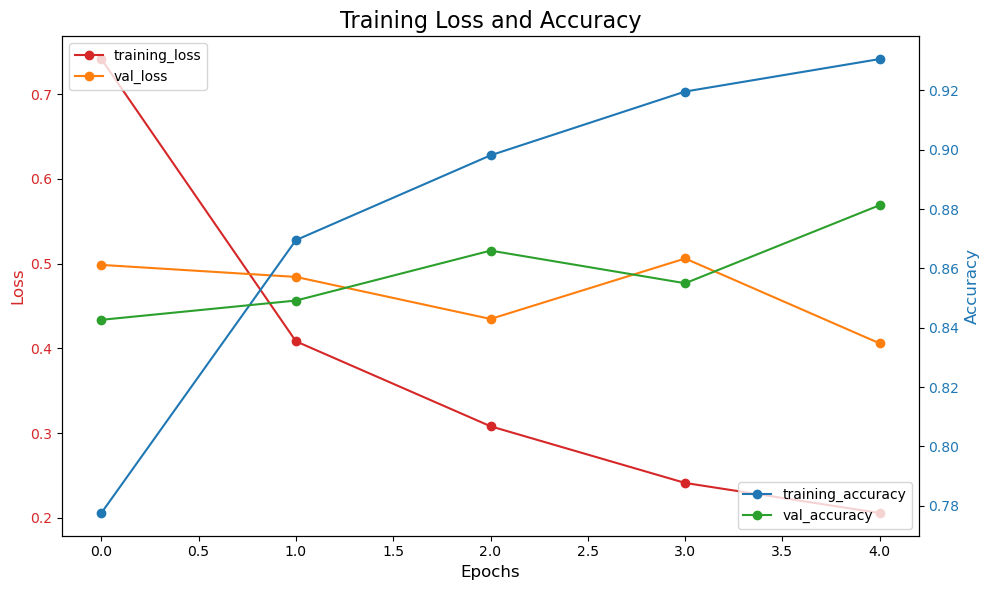

In [113]:
# Plot ResNet 50 model training history 
plot_training_curves_dual_axis(resnet_50_history)

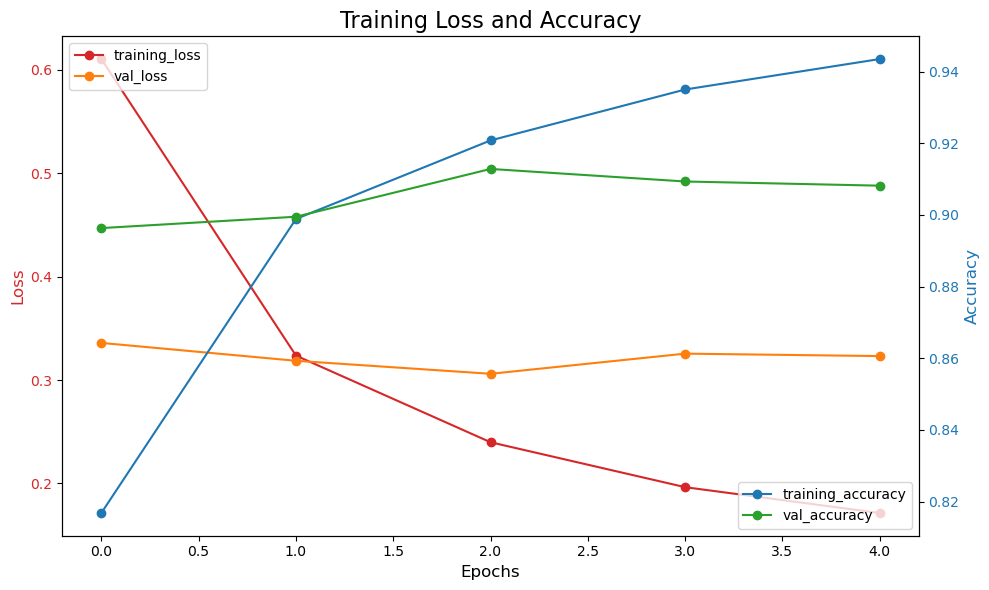

In [114]:
# Plot MobileNet V2 model training history 
plot_training_curves_dual_axis(mobilenet_v2_history)

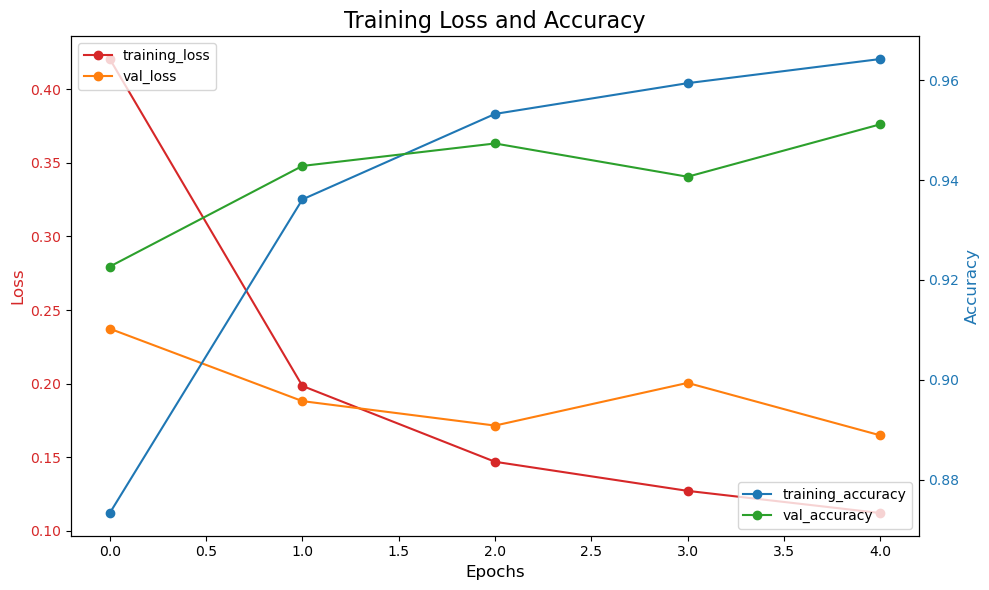

In [115]:
# Plot EfficientNet V2 B0 model training history 
plot_training_curves_dual_axis(efficientnet_v2_history)

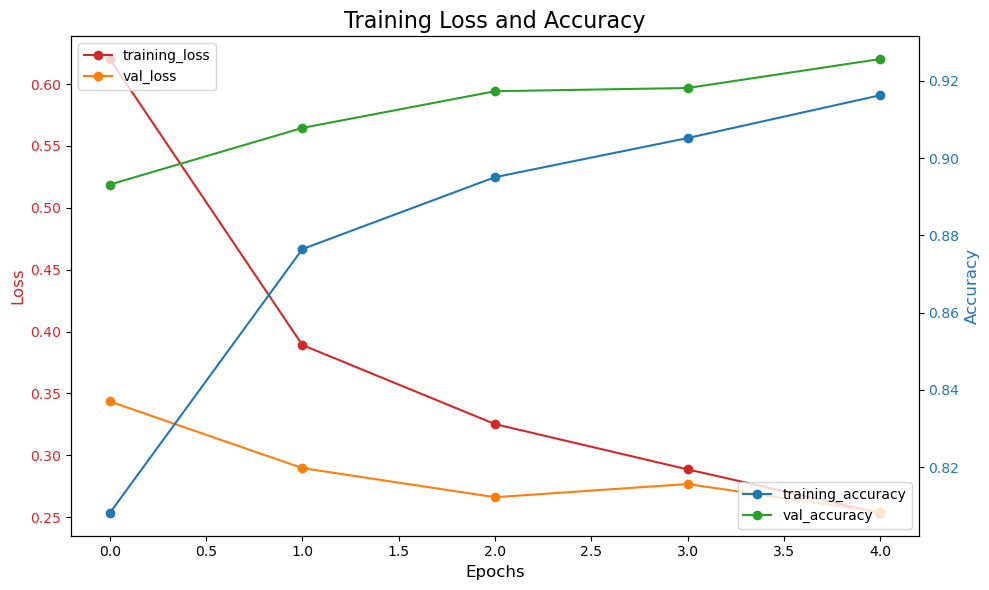

In [116]:
# Plot VIT B32 model training history 
plot_training_curves_dual_axis(vit_b32_history)

In [117]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12): 
    # Generate confusion matrix 
    cm = confusion_matrix(y_true, y_pred)
    
    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Blues',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=0.5, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)
    
    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20) 
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0) 
    plt.xticks(rotation=45, ha='right')

    # Plot confusion matrix
    plt.show()

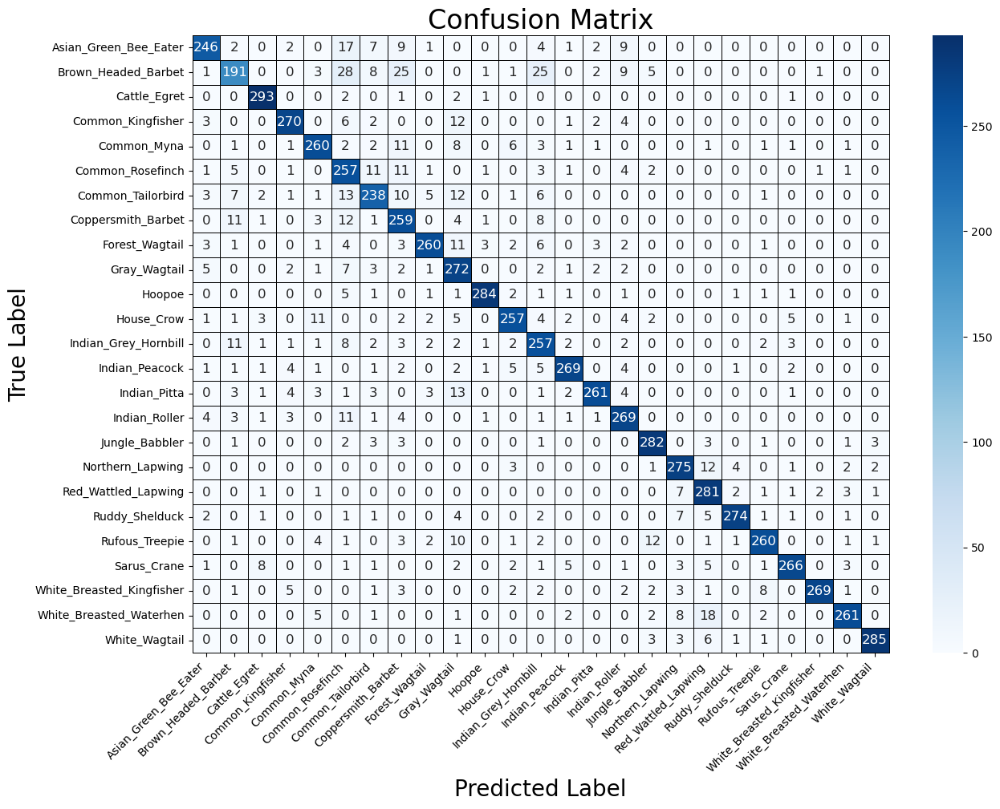

In [118]:
plot_confusion_matrix(
    test_df.label_encoded, 
    resnet_50_test_predictions, 
    figsize=(14, 10),  
    classes=class_names)

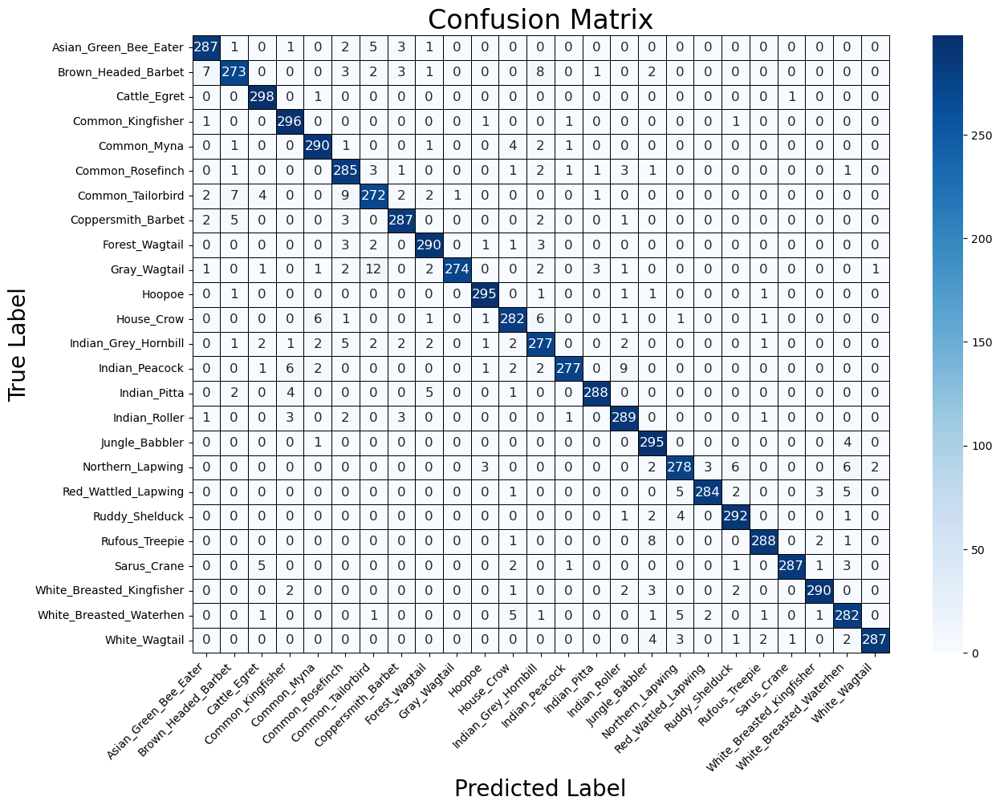

In [119]:
plot_confusion_matrix(
    test_df.label_encoded, 
    efficientnet_v2_test_predictions, 
    figsize=(14, 10),  
    classes=class_names)

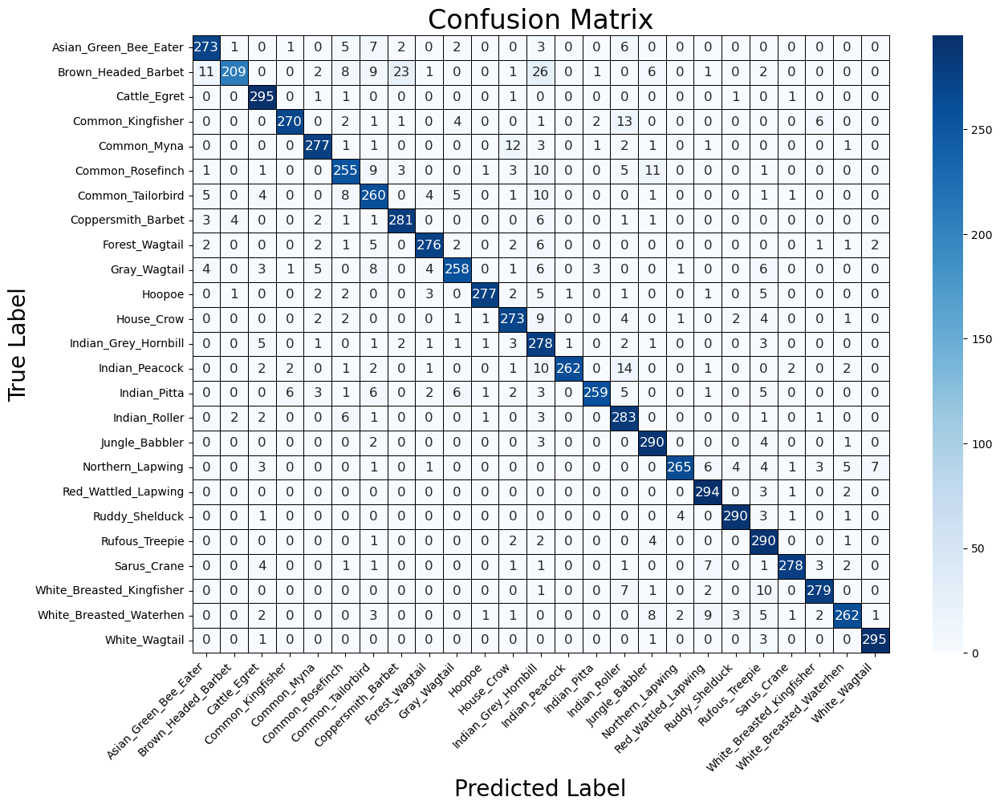

In [120]:
plot_confusion_matrix(
    test_df.label_encoded, 
    mobilenet_v2_test_predictions, 
    figsize=(14, 10), 
    classes=class_names)

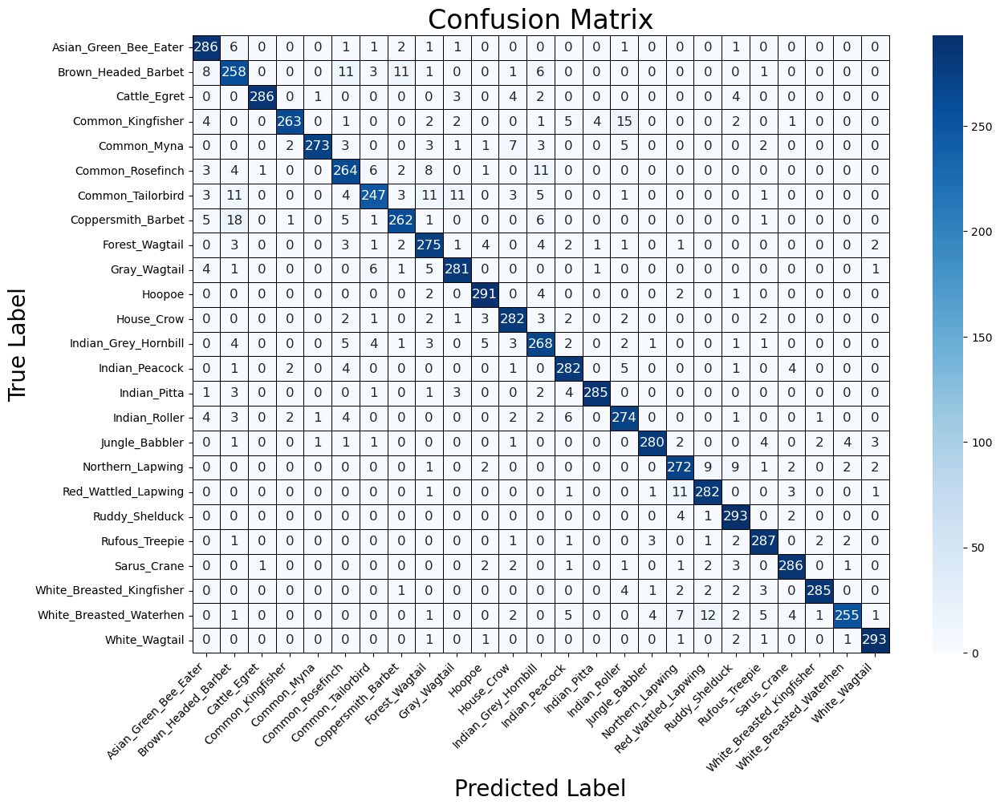

In [121]:
plot_confusion_matrix(
    test_df.label_encoded, 
    vit_b32_test_predictions, 
    figsize=(14, 10), 
    classes=class_names)

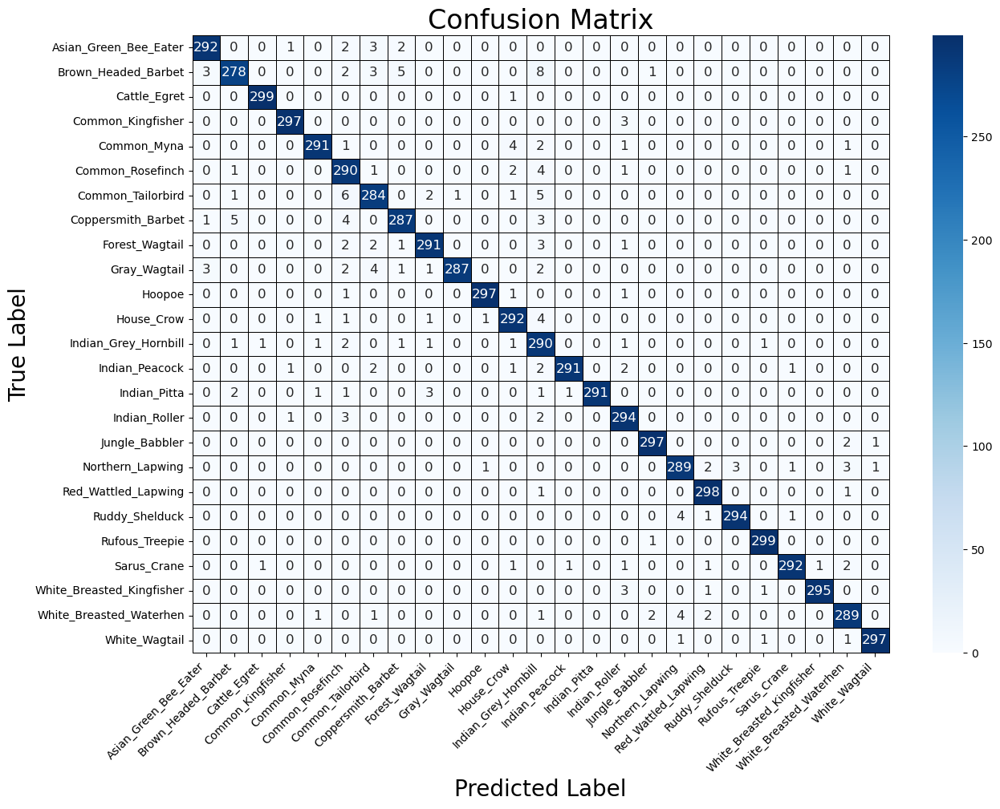

In [122]:
plot_confusion_matrix(
    test_df.label_encoded, 
    geometric_mean_predictions, 
    figsize=(14, 10), 
    classes=class_names)

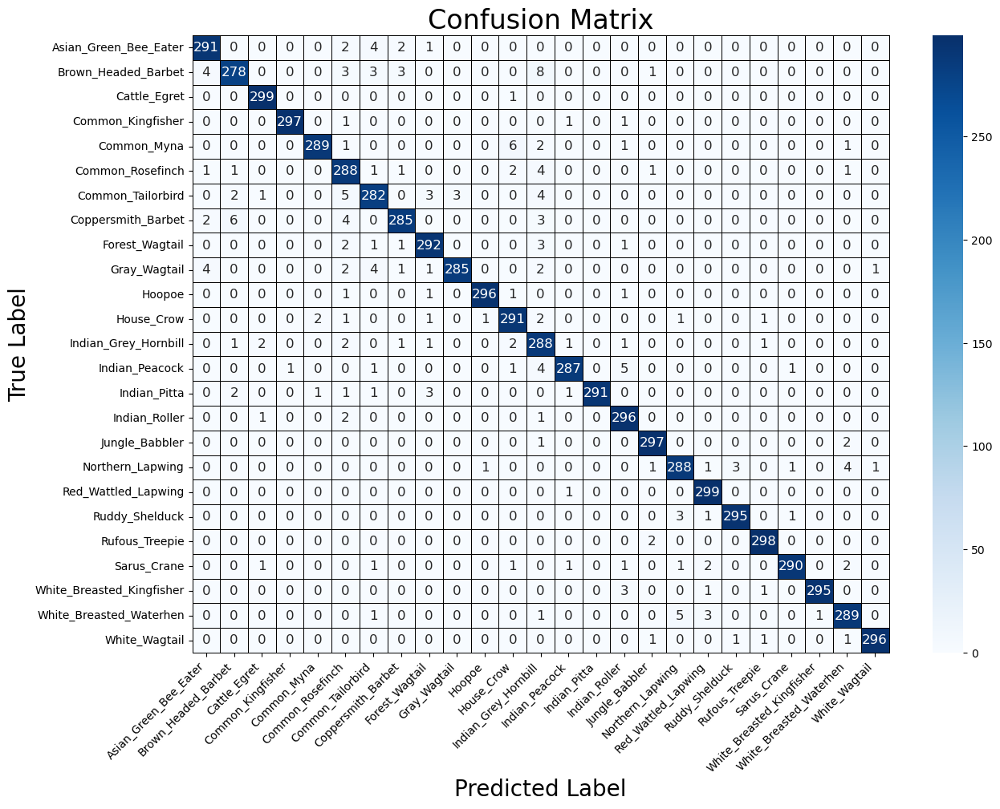

In [123]:
plot_confusion_matrix(
    test_df.label_encoded, 
    linear_mean_predictions, 
    figsize=(14, 10), 
    classes=class_names)

In [124]:
# ResNet 50 Report
print(classification_report(test_df.label_encoded, 
                            resnet_50_test_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.91      0.82      0.86       300
      Brown_Headed_Barbet       0.80      0.64      0.71       300
             Cattle_Egret       0.94      0.98      0.96       300
        Common_Kingfisher       0.92      0.90      0.91       300
              Common_Myna       0.88      0.87      0.87       300
         Common_Rosefinch       0.68      0.86      0.76       300
        Common_Tailorbird       0.83      0.79      0.81       300
       Coppersmith_Barbet       0.74      0.86      0.80       300
           Forest_Wagtail       0.94      0.87      0.90       300
             Gray_Wagtail       0.75      0.91      0.82       300
                   Hoopoe       0.97      0.95      0.96       300
               House_Crow       0.90      0.86      0.88       300
     Indian_Grey_Hornbill       0.77      0.86      0.81       300
           Indian_Peacock       0.93      0.90      0.91     

In [125]:
# EfficientNet V2 Report
print(classification_report(test_df.label_encoded, 
                            efficientnet_v2_test_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.95      0.96      0.96       300
      Brown_Headed_Barbet       0.93      0.91      0.92       300
             Cattle_Egret       0.96      0.99      0.97       300
        Common_Kingfisher       0.95      0.99      0.97       300
              Common_Myna       0.96      0.97      0.96       300
         Common_Rosefinch       0.90      0.95      0.93       300
        Common_Tailorbird       0.91      0.91      0.91       300
       Coppersmith_Barbet       0.95      0.96      0.96       300
           Forest_Wagtail       0.95      0.97      0.96       300
             Gray_Wagtail       1.00      0.91      0.95       300
                   Hoopoe       0.97      0.98      0.98       300
               House_Crow       0.93      0.94      0.94       300
     Indian_Grey_Hornbill       0.91      0.92      0.91       300
           Indian_Peacock       0.98      0.92      0.95     

In [126]:
# MobileNet V2 Report
print(classification_report(test_df.label_encoded, 
                            mobilenet_v2_test_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.91      0.91      0.91       300
      Brown_Headed_Barbet       0.96      0.70      0.81       300
             Cattle_Egret       0.91      0.98      0.95       300
        Common_Kingfisher       0.96      0.90      0.93       300
              Common_Myna       0.93      0.92      0.93       300
         Common_Rosefinch       0.86      0.85      0.86       300
        Common_Tailorbird       0.82      0.87      0.84       300
       Coppersmith_Barbet       0.90      0.94      0.92       300
           Forest_Wagtail       0.94      0.92      0.93       300
             Gray_Wagtail       0.92      0.86      0.89       300
                   Hoopoe       0.98      0.92      0.95       300
               House_Crow       0.89      0.91      0.90       300
     Indian_Grey_Hornbill       0.72      0.93      0.81       300
           Indian_Peacock       0.99      0.87      0.93     

In [127]:
# ViT-b32 Report
print(classification_report(test_df.label_encoded, 
                            vit_b32_test_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.90      0.95      0.93       300
      Brown_Headed_Barbet       0.82      0.86      0.84       300
             Cattle_Egret       0.99      0.95      0.97       300
        Common_Kingfisher       0.97      0.88      0.92       300
              Common_Myna       0.99      0.91      0.95       300
         Common_Rosefinch       0.86      0.88      0.87       300
        Common_Tailorbird       0.91      0.82      0.86       300
       Coppersmith_Barbet       0.92      0.87      0.90       300
           Forest_Wagtail       0.86      0.92      0.89       300
             Gray_Wagtail       0.92      0.94      0.93       300
                   Hoopoe       0.94      0.97      0.95       300
               House_Crow       0.91      0.94      0.93       300
     Indian_Grey_Hornbill       0.85      0.89      0.87       300
           Indian_Peacock       0.91      0.94      0.92     

In [128]:
# Geometric Mean Ensemble Report
print(classification_report(test_df.label_encoded, 
                            geometric_mean_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.98      0.97      0.97       300
      Brown_Headed_Barbet       0.97      0.93      0.95       300
             Cattle_Egret       0.99      1.00      1.00       300
        Common_Kingfisher       0.99      0.99      0.99       300
              Common_Myna       0.99      0.97      0.98       300
         Common_Rosefinch       0.91      0.97      0.94       300
        Common_Tailorbird       0.95      0.95      0.95       300
       Coppersmith_Barbet       0.97      0.96      0.96       300
           Forest_Wagtail       0.97      0.97      0.97       300
             Gray_Wagtail       1.00      0.96      0.98       300
                   Hoopoe       0.99      0.99      0.99       300
               House_Crow       0.96      0.97      0.97       300
     Indian_Grey_Hornbill       0.88      0.97      0.92       300
           Indian_Peacock       0.99      0.97      0.98     

In [129]:
# Geometric Mean Ensemble Report
print(classification_report(test_df.label_encoded, 
                            linear_mean_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.96      0.97      0.97       300
      Brown_Headed_Barbet       0.96      0.93      0.94       300
             Cattle_Egret       0.98      1.00      0.99       300
        Common_Kingfisher       1.00      0.99      0.99       300
              Common_Myna       0.99      0.96      0.98       300
         Common_Rosefinch       0.91      0.96      0.94       300
        Common_Tailorbird       0.94      0.94      0.94       300
       Coppersmith_Barbet       0.97      0.95      0.96       300
           Forest_Wagtail       0.96      0.97      0.97       300
             Gray_Wagtail       0.99      0.95      0.97       300
                   Hoopoe       0.99      0.99      0.99       300
               House_Crow       0.95      0.97      0.96       300
     Indian_Grey_Hornbill       0.89      0.96      0.92       300
           Indian_Peacock       0.98      0.96      0.97     

In [130]:
# Majority Voting Report
print(classification_report(test_df.label_encoded, 
                            majority_vote_predictions, 
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.96      0.97      0.97       300
      Brown_Headed_Barbet       0.96      0.93      0.94       300
             Cattle_Egret       0.98      1.00      0.99       300
        Common_Kingfisher       1.00      0.99      0.99       300
              Common_Myna       0.99      0.96      0.98       300
         Common_Rosefinch       0.91      0.96      0.94       300
        Common_Tailorbird       0.94      0.94      0.94       300
       Coppersmith_Barbet       0.97      0.95      0.96       300
           Forest_Wagtail       0.96      0.97      0.97       300
             Gray_Wagtail       0.99      0.95      0.97       300
                   Hoopoe       0.99      0.99      0.99       300
               House_Crow       0.95      0.97      0.96       300
     Indian_Grey_Hornbill       0.89      0.96      0.92       300
           Indian_Peacock       0.98      0.96      0.97     

In [139]:
def generate_performance_scores(y_true, y_pred, y_probabilities, top_k=3):
    """
    Calculate and display various performance metrics for a classification model.

    Args:
        y_true (list or np.array): True class labels.
        y_pred (list or np.array): Predicted class labels.
        y_probabilities (np.array): Predicted probabilities for each class.
        top_k (int): Value of `k` for top-k accuracy (default: 3).
    
    Returns:
        dict: A dictionary containing all calculated performance metrics.
    """
    # Calculate metrics
    metrics = {
        'accuracy_score': accuracy_score(y_true, y_pred),
        f'top_{top_k}_accuracy': top_k_accuracy_score(y_true, y_probabilities, k=top_k),
        'precision_score': None,
        'recall_score': None,
        'f1_score': None,
        'matthews_corrcoef': matthews_corrcoef(y_true, y_pred)
    }

    # Calculate precision, recall, and F1 score
    metrics['precision_score'], metrics['recall_score'], metrics['f1_score'], _ = precision_recall_fscore_support(
        y_true, y_pred, average="weighted"
    )

    # Print the metrics
    print("-" * 45)
    print("Performance Metrics".center(45))
    print("-" * 45)
    for key, value in metrics.items():
        print(f"{key:<20}: {value:.4f}")
    print("-" * 45)

    return metrics

In [140]:
# ResNet50 model performance scores
resnet50_performance = generate_performance_scores(test_df.label_encoded,
                                                          resnet_50_test_predictions, 
                                                          resnet_50_test_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.8795
top_3_accuracy      : 0.9655
precision_score     : 0.8853
recall_score        : 0.8795
f1_score            : 0.8803
matthews_corrcoef   : 0.8746
---------------------------------------------


In [141]:
# EfficieNet model performance scores
efficientnet_v2_performance = generate_performance_scores(test_df.label_encoded,
                                                          efficientnet_v2_test_predictions, 
                                                          efficientnet_v2_test_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.9524
top_3_accuracy      : 0.9885
precision_score     : 0.9531
recall_score        : 0.9524
f1_score            : 0.9524
matthews_corrcoef   : 0.9504
---------------------------------------------


In [142]:
# EfficieNet model performance scores
mobilenet_v2_performance = generate_performance_scores(test_df.label_encoded,
                                                          mobilenet_v2_test_predictions, 
                                                          mobilenet_v2_test_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.9105
top_3_accuracy      : 0.9771
precision_score     : 0.9161
recall_score        : 0.9105
f1_score            : 0.9108
matthews_corrcoef   : 0.9070
---------------------------------------------


In [143]:
# ViT model performance scores
vit_b32_performance = generate_performance_scores(test_df.label_encoded,
                                                  vit_b32_test_predictions, 
                                                  vit_b32_test_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.9213
top_3_accuracy      : 0.9819
precision_score     : 0.9230
recall_score        : 0.9213
f1_score            : 0.9215
matthews_corrcoef   : 0.9181
---------------------------------------------


In [144]:
# Generate Geometric Mean Ensemble performance scores
geometric_mean_ensemble_performance = generate_performance_scores(test_df.label_encoded,
                                                                geometric_mean_predictions, 
                                                                geometric_mean_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.9735
top_3_accuracy      : 0.9940
precision_score     : 0.9741
recall_score        : 0.9735
f1_score            : 0.9736
matthews_corrcoef   : 0.9724
---------------------------------------------


In [145]:
# Generate Linear Mean Ensemble performance scores
linear_mean_ensemble_performance = generate_performance_scores(test_df.label_encoded,
                                                                linear_mean_predictions, 
                                                                linear_mean_probabilities)

---------------------------------------------
             Performance Metrics             
---------------------------------------------
accuracy_score      : 0.9709
top_3_accuracy      : 0.9935
precision_score     : 0.9714
recall_score        : 0.9709
f1_score            : 0.9710
matthews_corrcoef   : 0.9697
---------------------------------------------


In [146]:
# Record metrics with DataFrame
performance_df = pd.DataFrame({
    'model_resnet_50': resnet50_performance,
    'model_efficientnet_v2': efficientnet_v2_performance,
    'model_mobilenet_v2': mobilenet_v2_performance,
    'model_vit_b32': vit_b32_performance,
    'geometric_mean_ensemble': geometric_mean_ensemble_performance,
    'linear_mean_ensemble': linear_mean_ensemble_performance
}).T

# View Performance DataFrame
performance_df

,accuracy_score,top_3_accuracy,precision_score,recall_score,f1_score,matthews_corrcoef
model_resnet_50,0.879467,0.965467,0.885268,0.879467,0.880337,0.874638
model_efficientnet_v2,0.952400,0.988533,0.953052,0.952400,0.952445,0.950440
model_mobilenet_v2,0.910533,0.977067,0.916134,0.910533,0.910790,0.907025
model_vit_b32,0.921333,0.981867,0.922966,0.921333,0.921455,0.918111
geometric_mean_ensemble,0.973467,0.994000,0.974063,0.973467,0.973594,0.972376
linear_mean_ensemble,0.970933,0.993467,0.971437,0.970933,0.971026,0.969736
